In [3]:
%matplotlib inline

import matplotlib
import matplotlib.pylab as pylab
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.patches as mpatches

import numpy as np

import cPickle as pickle
import json
import copy
import pprint


In [176]:
log = "/Users/njoubert/Code/spooky/logs/state0000681.pickle"

In [177]:
'''
Setting up Tableau Colors. 
http://tableaufriction.blogspot.ca/2012/11/finally-you-can-use-tableau-data-colors.html
'''
t10 = np.array([[31,119,180],[255,127,14],[44,160,44],[214,39,40],[148,103,189]])
t10 = t10/255.0

t10l = np.array([[174,199,232],[255,187,120],[152,223,138],[255,152,150],[197,176,213]])
t10l = t10l/255.0


In [178]:
def loadLog(logfile, startTime=0.0, endTime=-1.0):
    '''
    Load a logfile into an array of json objects.
    '''
    log = []
    with open(logfile, 'rb') as f:
        
        try:
            if startTime > 0.0:
                state = pickle.load(f)
                firstStamp = state['_timestamp']
                while (state['_timestamp'] - firstStamp) <= startTime:
                    state = pickle.load(f)
        except EOFError:
            print "Specified start point beyond end of file"
            sys.exit(0)

        try:
            while True:
                state = pickle.load(f)
                if state['_timestamp'] <= 0.0:
                    print "Faulty timestamp, ignoring"
                elif endTime > 0.0 and state['_timestamp'] - firstStamp > endTime:
                    return log
                else:
                    log.append(state)
        except EOFError:
            pass
        finally:
            return log

In [179]:
l = loadLog(log)

In [183]:
print l

[{'_timestamp': 1452460550.513753}, {'_timestamp': 1452460550.660676}, {'_timestamp': 1452460550.763749, '192.168.2.52': {'MsgGPSTime': {'wn': 1879, 'ns': -35035, 'flags': 0, 'tow': 76567700}, 'MsgPosLLH': {'v_accuracy': 0, 'n_sats': 8, 'lon': -122.17514441783422, 'tow': 76567700, 'height': 24.4075139873786, 'flags': 1, 'h_accuracy': 0, 'lat': 37.43123005293206}, 'MsgVelNED': {'v_accuracy': 0, 'e': -5, 'd': 5, 'tow': 76567700, 'n': -71, 'flags': 0, 'h_accuracy': 0, 'n_sats': 8}, 'ATTITUDE': {'pitchspeed': -0.04429653286933899, 'yaw': -1.2992905378341675, 'rollspeed': 0.024550694972276688, 'time_boot_ms': 5694332, 'pitch': -0.06311406195163727, 'mavpackettype': 'ATTITUDE', 'yawspeed': -0.006331593729555607, 'roll': 0.0756651908159256}, 'GLOBAL_POSITION_INT': {'lat': 374312217, 'lon': -1221751427, 'time_boot_ms': 5694150, 'hdg': 28556, 'relative_alt': 12640, 'mavpackettype': 'GLOBAL_POSITION_INT', 'vx': 4, 'vy': -1, 'alt': 34420, 'vz': 2}, 'MsgBaselineNED': {'v_accuracy': 0, 'e': 1397, '

In [148]:
def walk_key_tree(tree, i=0, sofar=[], accum=[]):
    '''
    given a tree where every level's children has the same structure,
    in the form of an array of arrays [[node1, node2], [node3, node4] etc]
    flatten this into an array of depth-first paths through the tree
    '''
    if i >= len(tree):
        accum += [sofar]
    else:
        for c in tree[i]:
            walk_key_tree(tree, i+1, sofar + [c])
    return accum
        

def dict_append_with_array(d, key_sequence, value):
    for i in range(len(key_sequence)-1):
        k = key_sequence[i]
        if not k in d:
            d[k] = {}
        d = d[k]
    if not key_sequence[-1][0] in d:
        d[key_sequence[-1][0]] = np.array([])
    d[key_sequence[-1][0]] = np.append(d[key_sequence[-1][0]], value / key_sequence[-1][1])

def dict_get_with_array(d, key_sequence):
    for i in range(len(key_sequence)-1):
        d = d[key_sequence[i]]
    return d[key_sequence[-1][0]]

def AoS2SoA(AoS, key_sequences):
    ''' assumed indices have a repeated structure, where at every level i select a set of'''
    struct = {}
    for state in AoS:

        for sequence in key_sequences:
            val = dict_get_with_array(state, sequence)
            dict_append_with_array(struct, sequence, val)
    
    return struct


In [151]:
pylab.rcParams['figure.figsize'] = 8, 8
def extractAndDrawIconicTrajectory(figure, log):
    '''
    Here we extract one nice image of the trajectory, to show us what it looks like.
    '''    
    
    key_tree = [["192.168.2.51","192.168.2.52"], ["MsgBaselineNED"], [("tow", 1), ("n", 1000.), ("e", 1000.), ("d", 1000.), ("flags", 1), ("n_sats",1)]]            
    key_sequences = walk_key_tree(key_tree)    
    traj_SoA = AoS2SoA(log, key_sequences)
    
    n1 = traj_SoA["192.168.2.51"]["MsgBaselineNED"]["n"]
    e1 = traj_SoA["192.168.2.51"]["MsgBaselineNED"]["e"]
    d1 = traj_SoA["192.168.2.51"]["MsgBaselineNED"]["d"]
    fl1 = traj_SoA["192.168.2.51"]["MsgBaselineNED"]["flags"]
    ns1 = traj_SoA["192.168.2.51"]["MsgBaselineNED"]["n_sats"]
    
    n2 = traj_SoA["192.168.2.52"]["MsgBaselineNED"]["n"]
    e2 = traj_SoA["192.168.2.52"]["MsgBaselineNED"]["e"]
    d1 = traj_SoA["192.168.2.52"]["MsgBaselineNED"]["d"]
    fl2 = traj_SoA["192.168.2.52"]["MsgBaselineNED"]["flags"]
    ns2 = traj_SoA["192.168.2.52"]["MsgBaselineNED"]["n_sats"]
    
    
    # Calculate limits
    nmin = np.min([n1,n2])
    nmax = np.max([n1,n2])
    nmid = (nmax + nmin)/2.0

    emin = np.min([e1,e2])
    emax = np.max([e1,e2])
    emid = (emax + emin)/2.0

    nemin = np.min([n1,n2,e1,e2])
    nemax = np.max([n1,n2,e1,e2])
    nediff2 = (nemax - nemin)/2.0

    elim = (emid-nediff2,emid+nediff2)
    nlim = (nmid-nediff2,nmid+nediff2)

    # Colors and Legends
    p1_color_fixed = t10[2]
    p1_color_float = t10l[2]
    p2_color_fixed = t10[3]
    p2_color_float = t10l[3]
    
    p1_fixed = mpatches.Patch(color=p1_color_fixed, label="P1 Fixed")
    p2_fixed = mpatches.Patch(color=p2_color_fixed, label="P2 Fixed")
    p1_float = mpatches.Patch(color=p1_color_float, label="P1 Float")
    p2_float = mpatches.Patch(color=p2_color_float, label="P2 Float")
    
    cmap_flags1 = matplotlib.colors.ListedColormap([p1_color_float, p1_color_fixed], name="niels_simple")
    cmap_flags2 = matplotlib.colors.ListedColormap([p2_color_float, p2_color_fixed], name="niels_simple")

    
    # Figure 1: Trajectory with Fix
    
    figure.set_title("2-person Trajectory: GPS Fix")
    figure.set_xlabel("East (meters)")
    figure.set_ylabel("North (meters)")
    figure.set_aspect('equal')
    figure.set_xlim(elim)
    figure.set_ylim(nlim)
    figure.axhline(0, color=(1,0,0,0.4))
    figure.axvline(0, color=(1,0,0,0.4))
    figure.scatter(e1, n1, c=fl1, cmap=cmap_flags1, vmin=0, vmax=1.0, s=10, linewidths=0.1)
    figure.scatter(e2, n2, c=fl2, cmap=cmap_flags2, vmin=0, vmax=1.0, s=10, linewidths=0.1)
    figure.grid(b=True, which='both')
    figure.legend(handles=[p1_fixed,p1_float,p2_fixed,p2_float])

    

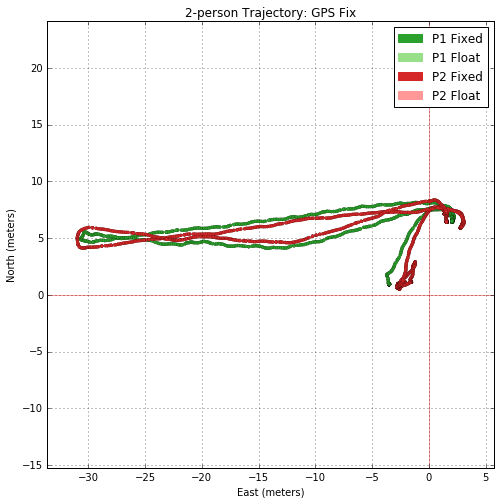

In [152]:

from matplotlib import gridspec
gs = gridspec.GridSpec(1, 1) 
fig = plt.figure()
f1 = fig.add_subplot(gs[0])

extractAndDrawIconicTrajectory(f1, l)

In [129]:
pylab.rcParams['figure.figsize'] = 16, 20
def extractAndDrawTrajectories(log, people=["192.168.2.51", "192.168.2.52"]):
    
    '''
    Extracts trajectories as a matrix:
    [ [timestamp, tow_1, n_1, e_1, d_1, flags_1, tow_2, n_2, e_2, d_2, flags_2], ...]
    Everything in SI units:
    time = seconds
    distance = meters
    '''
    
        
    
    vel = []
    vel_ardu = []
    baro = []
    
    for state in log:
        currentState = [state["_timestamp"]]
        currentVel = [state["_timestamp"]]
        currentVelArdu = [state["_timestamp"]]
        currentBaro = [state["_timestamp"]]

        for i in range(len(people)):
            p = people[i]
            tentry = [0]*6
            ventry = [0]*7
            vaentry = [0]*5
            bentry = [0]
            
            if p in state:
                tentry[0] = state[p]["MsgBaselineNED"]["tow"] / 1000.0
                tentry[1] = state[p]["MsgBaselineNED"]["n"] / 1000.0
                tentry[2] = state[p]["MsgBaselineNED"]["e"] / 1000.0
                tentry[3] = state[p]["MsgBaselineNED"]["d"] / 1000.0
                tentry[4] = state[p]["MsgBaselineNED"]["flags"]
                tentry[5] = state[p]["MsgBaselineNED"]["n_sats"]
                
                ventry[0] = state[p]["MsgVelNED"]["tow"] / 1000.0
                ventry[1] = state[p]["MsgVelNED"]["n"] / 1000.0
                ventry[2] = state[p]["MsgVelNED"]["e"] / 1000.0
                ventry[3] = state[p]["MsgVelNED"]["d"] / 1000.0
                ventry[4] = state[p]["MsgVelNED"]["n_sats"]
                ventry[5] = np.linalg.norm([ventry[1],ventry[2]]) # Groundspeed
                ventry[6] = np.linalg.norm([ventry[1],ventry[2],ventry[3]]) # 3D Speed
                
                vaentry[0] = state[p]["GLOBAL_POSITION_INT"]["vx"] / 100.0
                vaentry[1] = state[p]["GLOBAL_POSITION_INT"]["vy"] / 100.0
                vaentry[2] = state[p]["GLOBAL_POSITION_INT"]["vz"] / 100.0
                vaentry[3] = np.linalg.norm([vaentry[0],vaentry[1]]) # Fused Grounspeed
                vaentry[4] = np.linalg.norm([vaentry[0],vaentry[1],vaentry[2]]) # Fused 3D Speed
                
                bentry[0] = state[p]["GLOBAL_POSITION_INT"]["relative_alt"] / 1000.0

            currentState += tentry
            currentVel += ventry
            currentVelArdu += vaentry
            currentBaro += bentry
            
        traj.append(currentState)
        vel.append(currentVel)
        vel_ardu.append(currentVelArdu)
        baro.append(currentBaro)
        
    traj = np.array(traj)
    vel = np.array(vel)
    vel_ardu = np.array(vel_ardu)
    baro = np.array(baro)
    
    '''
    Which plots do we want to make?

    1) Show GPS fix over time for both people

    2) Show trajectory-over-time

    3) Show goodness of timing

    '''
    ts = traj[:,0] - traj[0,0]
    
    t1 = traj[:,1] - traj[0,1]
    
    n1 = traj[:,2]
    e1 = traj[:,3]
    d1 = traj[:,4]
    fl1 = traj[:,5]
    ns1 = traj[:,6]
    
    t2 = traj[:,7] - traj[0,1]
    n2 = traj[:,8]
    e2 = traj[:,9]
    d2 = traj[:,10]
    fl2 = traj[:,11]
    ns2 = traj[:,12]
    
    tv = vel[:,0] - vel[0,0]
    v2d1 = vel[:,6]
    v2d2 = vel[:,13]
    
    v2da1 = vel_ardu[:,4]
    v2da2 = vel_ardu[:,9]

    
    tdiff_tow = np.around(np.append(np.diff(t1),np.diff(t2)), decimals=6)
    tdiff_stamp = np.around(np.diff(ts), decimals=6)

    
    from matplotlib import gridspec
    gs = gridspec.GridSpec(5, 2, width_ratios=[1,1], height_ratios=[2,1,1,1,1]) 
    
    fig = plt.figure()

    f1 = fig.add_subplot(gs[0])
    f2 = fig.add_subplot(gs[1])
    f3 = fig.add_subplot(gs[2])
    f4 = fig.add_subplot(gs[3])
    f5 = fig.add_subplot(gs[4])
    f6 = fig.add_subplot(gs[5])
    f7 = fig.add_subplot(gs[6])
    f8 = fig.add_subplot(gs[7])
    f9 = fig.add_subplot(gs[8])


    # Calculate limits
    nmin = np.min([n1,n2])
    nmax = np.max([n1,n2])
    nmid = (nmax + nmin)/2.0

    emin = np.min([e1,e2])
    emax = np.max([e1,e2])
    emid = (emax + emin)/2.0

    nemin = np.min([n1,n2,e1,e2])
    nemax = np.max([n1,n2,e1,e2])
    nediff2 = (nemax - nemin)/2.0

    elim = (emid-nediff2,emid+nediff2)
    nlim = (nmid-nediff2,nmid+nediff2)

    # Colors and Legends
    p1_color_fixed = t10[2]
    p1_color_float = t10l[2]
    p2_color_fixed = t10[3]
    p2_color_float = t10l[3]
    
    p1_fixed = mpatches.Patch(color=p1_color_fixed, label="P1 Fixed")
    p2_fixed = mpatches.Patch(color=p2_color_fixed, label="P2 Fixed")
    p1_float = mpatches.Patch(color=p1_color_float, label="P1 Float")
    p2_float = mpatches.Patch(color=p2_color_float, label="P2 Float")
    
    cmap_flags1 = matplotlib.colors.ListedColormap([p1_color_float, p1_color_fixed], name="niels_simple")
    cmap_flags2 = matplotlib.colors.ListedColormap([p2_color_float, p2_color_fixed], name="niels_simple")

    
    # Figure 1: Trajectory with Fix
    
    f1.set_title("2-person Trajectory: GPS Fix")
    f1.set_xlabel("East (meters)")
    f1.set_ylabel("North (meters)")
    f1.set_aspect('equal')
    f1.set_xlim(elim)
    f1.set_ylim(nlim)
    f1.axhline(0, color=(1,0,0,0.4))
    f1.axvline(0, color=(1,0,0,0.4))
    f1.scatter(e1, n1, c=fl1, cmap=cmap_flags1, vmin=0, vmax=1.0, s=10, linewidths=0.1)
    f1.scatter(e2, n2, c=fl2, cmap=cmap_flags2, vmin=0, vmax=1.0, s=10, linewidths=0.1)
    f1.grid(b=True, which='both')
    f1.legend(handles=[p1_fixed,p1_float,p2_fixed,p2_float])

    # Figure 2: Trajectory over Time

    f2.set_title("Trajectory over Time")
    f2.set_xlabel("East (meters)")
    f2.set_ylabel("North (meters)")
    f2.set_aspect('equal')
    f2.set_xlim(elim)
    f2.set_ylim(nlim)
    f2.axhline(0, color=(1,0,0,0.4))
    f2.axvline(0, color=(1,0,0,0.4))
    f2.scatter(e1, n1, c=t1, cmap='jet', s=10, linewidths=0)
    f2.scatter(e2, n2, c=t2, cmap='jet', s=10, linewidths=0)
    
    begin = mpatches.Patch(color="blue", label="Beginning")
    mid = mpatches.Patch(color="lightgreen", label="Middle")
    end = mpatches.Patch(color="red", label="End")
    f2.legend(handles=[begin,mid,end])

    # Figure 3: GPS Height
    
    f3.set_title("Height over Time in MsgBaselineNED")
    f3.set_xlabel("Time (seconds)")
    f3.set_ylabel("Relative Altitude (meters)")
    f3.scatter(t1, -1*d1, c=fl1, cmap=cmap_flags1, vmin=0, vmax=1.0, linewidths=0)
    f3.scatter(t2, -1*d2, c=fl2, cmap=cmap_flags2, vmin=0, vmax=1.0, linewidths=0)
    f3.set_xlim(0,np.max(t1))
    f3.legend(handles=[p1_fixed,p2_fixed])

    # Figure 4: Baro Height

    f4.set_title("Relative Height over Time in GLOBAL_POSITION_INT (Fused with Baro)")
    f4.set_xlabel("Time (seconds)")
    f4.set_ylabel("Relative Altitude (meters)")
    f4.plot(tv, baro[:,1] - baro[0,1], c=p1_color_fixed)
    f4.plot(tv, baro[:,2] - baro[0,2], c=p2_color_fixed)
    f4.legend(handles=[p1_fixed,p2_fixed])
    
    # Figure 5: Velocity Piksi
    
    f5.set_title("2D North-East Speed over Time in MsgVelNED")
    f5.set_xlabel("Time (seconds)")
    f5.set_ylabel("Velocity")
    f5.set_xlim(0,np.max(tv))
    f5.set_ylim(np.min([v2d1, v2d2]), np.max([v2d1, v2d2]))
    f5.plot(tv, v2d1, c=p1_color_fixed)
    f5.plot(tv, v2d2, c=p2_color_fixed)

    # Figure 6: Velocity Fused

    f6.set_title("2D North-East Speed over Time in GLOBAL_POSITION_INT (Fused with Accel)")
    f6.set_xlabel("Time (seconds)")
    f6.set_ylabel("Velocity")
    f6.set_xlim(0,np.max(tv))
    f6.set_ylim(np.min([v2da1, v2da2]), np.max([v2da1, v2da2]))
    f6.plot(tv, v2da1, c=p1_color_fixed)
    f6.plot(tv, v2da2, c=p2_color_fixed)

    # Figure 7: Timing of state timestamp
     
    f7.set_title("Average Frequency of Full State Calculations on GroundStation")
    f7.set_ylabel("Frequency (number of samples)")
    f7.set_xlabel("Time Deltas (seconds)")
    f7.hist(tdiff_stamp)

    # Figure 8: Timing of Piksi TOW
    
    f8.set_title("Average Frequency of Recorded GPS Samples")
    f8.set_ylabel("Frequency (number of samples)")
    f8.set_xlabel("Time Deltas (seconds)")
    f8.hist(tdiff_tow)

    # Figure 9: Number of Satellites
    
    f9.set_title("Number of Satellites in MsgBaselineNED")
    f9.set_xlabel("Time (seconds)")
    f9.set_ylabel("Number of Satellites")
    f9.plot(t1,ns1, c=p1_color_fixed)
    f9.plot(t2,ns2, c=p2_color_fixed)

    plt.tight_layout()

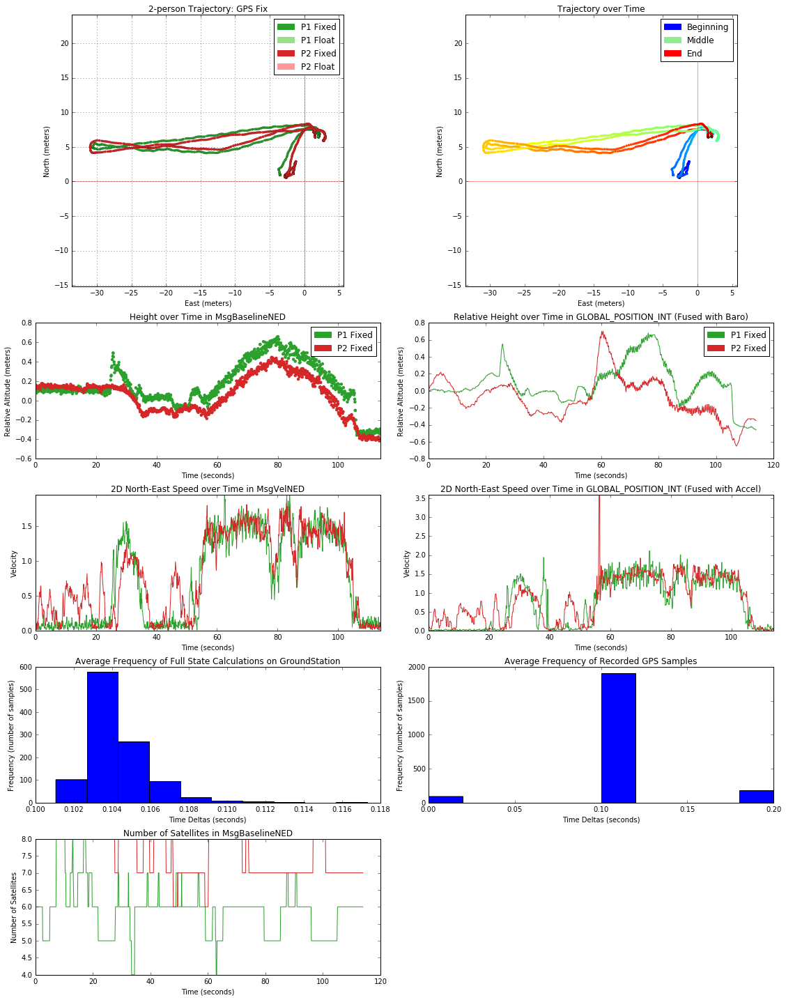

In [130]:

extractAndDrawTrajectories(l)

In [175]:

from os import listdir
from os.path import join, splitext, isfile

p = "/Users/njoubert/Code/spooky/logs/"
all_logs = [f for f in listdir(p) if isfile(join(p, f)) and splitext(f)[1] == ".pickle"]


unrendered_logs = [f for f in all_logs if not(isfile(join(p, splitext(f)[0] + ".iconic.png")))]



['state0000356.pickle',
 'state0000435.pickle',
 'state0000436.pickle',
 'state0000446.pickle',
 'state0000447.pickle',
 'state0000448.pickle',
 'state0000449.pickle',
 'state0000450.pickle',
 'state0000451.pickle',
 'state0000452.pickle',
 'state0000453.pickle',
 'state0000455.pickle',
 'state0000628.pickle',
 'state0000680.pickle',
 'state0000681.pickle',
 'state0000682.pickle',
 'state0000693.pickle',
 'state0000894.pickle',
 'state0000898.pickle',
 'state0000899.pickle',
 'state0000902.pickle',
 'state0000903.pickle',
 'state0000905.pickle',
 'state0000906.pickle',
 'state0000907.pickle']